# Delhi Metro: Passenger Mobility Analysis

Analysis of 16.8M+ metro entry-exit records from DMRC (2018). Covers data preprocessing, station load calculation across 10-minute time buckets, and route load inference using Dijkstra's algorithm on the metro network graph.

See [README](README.md) for project overview and key findings.

# **Work Progress**

---




✅ Cleaned and combined the dataset from all csv's.

✅ Worked on the readability of the code and improved implementation.

✅ Applied same logic for both entry and exit.
                                         
✅ Attempting Parallelization for faster run time.                                 

✅ Route Load (ask for approach and resources)                                                        


In [ ]:
## RUN ##

# Connecting the Colab Notebook to the Google Drive

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
## RUN ##

# Importing all the relevant libraries

import numpy as np
import pandas as pd
import io
import math
import os
import time
import datetime
# !pip install geopandas
from shapely import geometry
# import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point, Polygon
from bokeh.plotting import figure, show
from bokeh.models import Legend, LegendItem
import json
from bokeh.io import output_notebook

import folium  # for plotting data on maps
import random  # random sampling
from geopy.distance import distance  # geo spatial distance computations
import requests  # for making API requests
# from google.transit import gtfs_realtime_pb2  # for reading realtime GTFS data
from collections import defaultdict  # python's special distionary data structure


import pickle
from tqdm import tqdm

In [ ]:
PATH_TO_DATASET='/content/drive/MyDrive/Multimodal-BTP-Dataset/Multimodal Commuter Mobility Delhi/Delhi Metro Rail Corporation Entry Exit Data/'
PATH_TO_CACHE='/content/drive/MyDrive/Multimodal-BTP-Dataset/Multimodal Commuter Mobility Delhi/Delhi Metro Rail Corporation Entry Exit Data/datacache/'

In [ ]:

# ## RUN ##



# id_to_station=dict()
# station_to_id=dict()
# df_combined=pd.DataFrame()



# # Reading the Data

# PATH_TO_DATASET='/content/drive/MyDrive/Multimodal-BTP-Dataset/Multimodal Commuter Mobility Delhi/Delhi Metro Rail Corporation Entry Exit Data/'
# PATH_TO_CACHE=os.path.join(PATH_TO_DATASET,'datacache')


# os.chdir(PATH_TO_DATASET)

# station_mapping = pd.read_excel('StationID_StationName_Mapping.xlsx',sheet_name='StationID-Mapping')

# names = !(ls | grep .csv)

# # Storing station-id mappings

# for index, row in station_mapping.iterrows():
#     stat_name = row["Station"]
#     stat_id = row["SiteID"]
#     if(not math.isnan(stat_id)):
#      station_to_id[stat_name]=int(stat_id)
#      id_to_station[int(stat_id)]=stat_name

# # Combining the dataset

# for name in names:
#   file_path=os.path.join(PATH_TO_DATASET,name)
#   df_file=pd.read_csv(file_path)
#   df_file.columns = ['EntryStationId', 'EntryTime', 'ExitStationId', 'ExitTime']
#   df_combined=df_combined.append(df_file,ignore_index='True')


# # Checking if the dataset has been properly combined or not


# len(df_combined)  # 16.8 million entries

In [ ]:
# with open(PATH_TO_CACHE+'df_combined_metro.pkl', 'wb') as f:
#    pickle.dump(df_combined, f)

# with open(PATH_TO_CACHE+'station_to_id.pkl', 'wb') as f:
#    pickle.dump(station_to_id, f)


# with open(PATH_TO_CACHE+'id_to_station.pkl', 'wb') as f:
#    pickle.dump(id_to_station, f)


In [ ]:

df_combined=pd.read_pickle(PATH_TO_CACHE+'df_combined_metro.pkl')
id_to_station=pd.read_pickle(PATH_TO_CACHE+'id_to_station.pkl')
station_to_id=pd.read_pickle(PATH_TO_CACHE+'station_to_id.pkl')

In [ ]:
print(len(df_combined))
df_combined.tail()

16882059


,EntryStationId,EntryTime,ExitStationId,ExitTime
16882054,79,2018-07-28 18:12:34.000,170,2018-07-28 18:28:07.000
16882055,79,2018-07-28 18:12:36.000,170,2018-07-28 18:27:41.000
16882056,35,2018-07-28 16:12:58.000,170,2018-07-28 17:44:35.000
16882057,79,2018-07-28 18:28:40.000,170,2018-07-28 18:44:31.000
16882058,79,2018-07-28 18:21:55.000,170,2018-07-28 19:02:04.000


In [ ]:

os.chdir(PATH_TO_CACHE)


stat_load=np.full((250, 150,2), 0)    # 3RD DIMENSION OF THE MATRIX: 0-> weekday, 1 -> weekend

days_set=set()

days_mapping={
    0:"Mon",1:"Tue",2:"Wed",3:"Thu",
    4:"Fri",5:"Sat",6:"Sun"
}


In [ ]:
# def calc_station_load():

#   for index in tqdm(df_combined.index):
#    in_timedata=df_combined['EntryTime'][index].split()
#    out_timedata=df_combined['ExitTime'][index].split()

#    in_date=in_timedata[0].split("-")

#    cur_year=int(in_date[0])
#    cur_month=int(in_date[1])
#    cur_date=int(in_date[2])
#    cur_day=datetime.date(cur_year,cur_month,cur_date).weekday()   # cur day of the week

#    days_set.add(in_timedata[0])


#    station_in=df_combined['EntryStationId'][index]
#    station_out=df_combined['ExitStationId'][index]

#    in_time=in_timedata[1].split(":")
#    out_time=out_timedata[1].split(":")

#    time_bucket_in=int(in_time[0])*60+int(in_time[1])
#    time_bucket_in//=10                                    # time bucket for entry


#    time_bucket_out=int(out_time[0])*60+int(out_time[1])
#    time_bucket_out//=10                                   # time bucket for exit

#    daytype=cur_day//5

#    stat_load[station_in][time_bucket_in][daytype]+=1
#    stat_load[station_out][time_bucket_out][daytype]+=1  # assuming entry day to be same as exit day

#   with open(PATH_TO_CACHE+'stat_loaded.pkl', 'wb') as f:
#    pickle.dump(stat_load, f)




# calc_station_load()

In [ ]:
# for i in range(0,100):
#   print(stat_load[i][55][0])

In [ ]:
stat_load=pd.read_pickle(PATH_TO_CACHE+'stat_loaded.pkl')
type(stat_load)

numpy.ndarray

In [ ]:
for i in range(0,100):
  print(stat_load[i][55][0])

0
6318
1893
2881
1666
1663
1835
1335
1403
2259
1135
1178
1011
1513
961
2206
1699
3422
4200
5132
818
1296
3360
2256
1431
6107
4971
2921
4408
1063
1933
886
5866
3682
2444
3229
4298
1804
3739
0
2941
1586
2125
2266
2930
3645
2371
2836
6323
3775
4088
6994
2120
1288
835
1286
742
1253
1313
1600
2152
5124
3189
1392
1595
1137
6239
1531
2074
2779
5010
5551
146
3255
4068
1102
2682
6347
4582
3061
4
1668
8047
4159
1329
2308
3219
6692
5050
4920
6587
8082
1538
5245
1504
1074
1678
2719
5631
5265


In [ ]:
def show_station_load(id):
  x_axis=np.arange(0,144)
  x_time=x_axis*10
  x_time//=60
  y0=np.zeros((144))
  y1=np.zeros((144))

  c0,c1=0,0
  # cnt_wd,cnt_we=count_weekdays_and_weekends()

  for bucket in range(0,144):
    y0[bucket]=stat_load[id][bucket][0]
    y1[bucket]=stat_load[id][bucket][1]
    c0+=stat_load[id][bucket][0]
    c1+=stat_load[id][bucket][1]


  TITLE=f"{id_to_station[id]} - Weekend vs Weekday Load Analysis"

  plt.title(TITLE)
  plt.xlabel("Hour of the Day")
  plt.ylabel("Station Load")
  plt.plot(x_axis, y0, color ="cyan",label=f"Weekday Load: {c0}")
  plt.plot(x_axis, y1, color ="black",label=f"Weekend Load: {c1}")

  x_ticks = np.arange(0,144,18)

  x_labels = []

  for i in range(0,8):
   x_labels.append(f"{3*i}:00")

# Adding x-axis values to plot
  plt.xticks(ticks=x_ticks, labels=x_labels)
  plt.legend()
  plt.show()


In [ ]:
station_to_id['Rajiv Chowk']

26

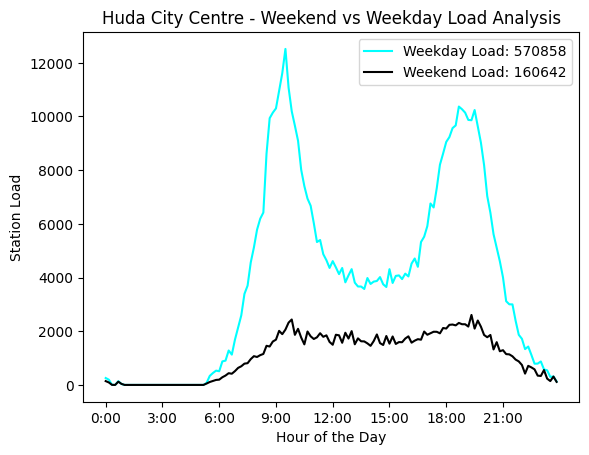

In [ ]:
show_station_load(101)

In [ ]:
def show_station_load_total():
  x_axis=np.arange(0,144)
  x_time=x_axis*10
  x_time//=60
  y0=np.zeros((144))
  y1=np.zeros((144))

  c0,c1=0,0
  # cnt_wd,cnt_we=count_weekdays_and_weekends()

  for id in range(0,250):
    for bucket in range(0,144):
      y0[bucket]+=stat_load[id][bucket][0]
      y1[bucket]+=stat_load[id][bucket][1]
      c0+=stat_load[id][bucket][0]
      c1+=stat_load[id][bucket][1]


  TITLE=f"All Metro Stations - Weekend vs Weekday Load Analysis"

  plt.title(TITLE)
  plt.xlabel("Hour of the Day")
  plt.ylabel("Station Load (in millions)")
  plt.plot(x_axis, y0/int(1e6), color ="blue",label=f"Weekday Load: {c0}")
  plt.plot(x_axis, y1/int(1e6), color ="red",label=f"Weekend Load: {c1}")

  x_ticks = np.arange(0,144,18)

  x_labels = []

  for i in range(0,8):
   x_labels.append(f"{3*i}:00")

# Adding x-axis values to plot
  plt.xticks(ticks=x_ticks, labels=x_labels)
  plt.legend()
  plt.show()


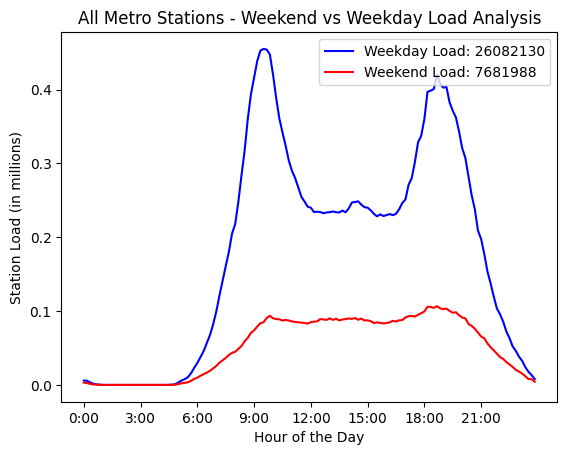

In [ ]:
show_station_load_total()

In [ ]:
os.chdir(PATH_TO_DATASET)

In [ ]:
print(stat_load[station_to_id['Rajiv Chowk']][40][1])
print(stat_load[station_to_id['Rajiv Chowk']][40][0])

269
708


In [ ]:
bheed=dict()
for i in range(0,250):
  if i not in id_to_station:
    continue
  cnt=0
  for j in range(0,144):
    for k in range(0,2):
      cnt+=stat_load[i][j][k]

  bheed[id_to_station[i]]=cnt


bheed= dict(sorted(bheed.items(), key=lambda x: x[1], reverse=True))
bheed

{'Rajiv Chowk': 843067,
 'New Delhi': 799889,
 'Huda City Centre': 731500,
 'Chandni Chowk': 694765,
 'City Centre': 614283,
 'Karol Bagh': 598377,
 'GTB Nagar': 594030,
 'Saket': 555727,
 'Dwarka Mor': 508525,
 'Vaishali': 502314,
 'Laxmi Nagar': 473691,
 'Shahdara': 469230,
 'Uttam Ngr East': 461352,
 'M.G.Road': 436102,
 'Malaviya Nagar': 416182,
 'AIIMS': 398029,
 'Dilshad Garden': 395079,
 'Chhatar Pur': 394726,
 'R.K.Ashram': 378906,
 'Nirman Vihar': 376348,
 'Kashmere Gate Metro': 372605,
 'Rajendra Place': 368213,
 'Botanical Garden-8': 362066,
 'Noida Sec-15': 359226,
 'Green Park': 355343,
 'Barakhamba Road': 344269,
 'Shadipur': 334942,
 'Hauzkhas': 333579,
 'Rithala': 326140,
 'Vishwa Vidyalaya': 322879,
 'Gobind Puri': 307890,
 'Sikandar Pur': 307717,
 'Noida Sec-18': 307687,
 'Chawri Bazar': 305650,
 'INA': 299266,
 'Anand Vihar ISBT': 297977,
 'Jahangir Puri': 296719,
 'Kaushambi': 291338,
 'Iffco Chowk': 291052,
 'Tilak Nagar': 276895,
 'Subhash Nagar': 268300,
 'Noida 

In [ ]:
os.chdir(PATH_TO_DATASET)

### Route Analysis: Metros

In [ ]:
## RUN ##


INF=int(1e9)
smallest_vis=np.full((250, 250), 0)
smallest_dist=np.full((250, 250), INF)
smallest_prev=np.full((250,250),-1)
metro_adjacency=np.full((250, 250), 0)
route_info=dict()
route_load=np.full((250, 250,48,2), 0) #taking 30 min time bucket for now

line_col=dict()


metro_routes_data_df = pd.read_excel('StationID_StationName_Mapping.xlsx', sheet_name='RoutesDelhiMetro')
print(metro_routes_data_df.head())


def make_graph():
 row_size=len(metro_routes_data_df)
 for index in range(0,row_size-1):
  ls1=str(metro_routes_data_df['Station ID'][index]).split(", ")
  ls2=str(metro_routes_data_df['Station ID'][index+1]).split(", ")
  for i1 in ls1:
    for i2 in ls2:

      if(i1=='nan' or i2=='nan'):
       continue;

      this_line=metro_routes_data_df['Line Color'][index]

      id1=int(float(i1))
      id2=int(float(i2))
      line_col[(id1,id2)]=this_line
      line_col[(id2,id1)]=this_line
      metro_adjacency[id1][id2]=1
      metro_adjacency[id2][id1]=1
      #print(id1,id2)



def calc_metro_route_optimal(id):
  smallest_dist[id][id]=0;
  station_queue =[]
  station_queue.append(id)
  smallest_vis[id][id]=1
  while len(station_queue) > 0:
    node=station_queue.pop(0)
    for i in range (0,250):
      if(metro_adjacency[node][i]>0 and not smallest_vis[id][i]):
        station_queue.append(i)
        smallest_vis[id][i]=1
        smallest_dist[id][i]=smallest_dist[id][node]+1
        smallest_prev[id][i]=node



def get_path_optimal(id1, id2):
  if not smallest_vis[id1][id2]:
    print(f'No path b/w {id1} and {id2}')
    return []

  cur=id2

  path=[]

  while cur >0:
    path.append(cur)
    cur=smallest_prev[id1][cur]

  path.reverse()

  return path

def precompute_shortest_paths():
  for i in range (0,250):
    calc_metro_route_optimal(i)


def cache_routes():
  c1=0
  for s1 in range(0,250):
    for s2 in range(0,250):
      if smallest_vis[s1][s2]:
        c1+=1
        path=get_path_optimal(s1,s2)
        route_info[(s1,s2)]=path

  return c1


make_graph()
precompute_shortest_paths()
cache_routes()



  Line   Station Name Station ID              Opening Line Color Old Name
0  Red  Shaheed Sthal        NaN  2019-03-08 00:00:00   Red Line      NaN
1  NaN   Hindon River        NaN  2019-03-08 00:00:00   Red Line      NaN
2  NaN        Arthala        NaN  2019-03-08 00:00:00   Red Line      NaN
3  NaN    Mohan Nagar        NaN  2019-03-08 00:00:00   Red Line      NaN
4  NaN     Shyam Park        NaN  2019-03-08 00:00:00   Red Line      NaN


44140

In [ ]:
# def calc_route_load():

#   for index in tqdm(df_combined.index):
#    in_timedata=df_combined['EntryTime'][index].split()
#    out_timedata=df_combined['ExitTime'][index].split()
#    station_in=df_combined['EntryStationId'][index]
#    station_out=df_combined['ExitStationId'][index]
#    in_time= in_timedata[1].split(":")

#    in_date= in_timedata[0].split("-")
#    cur_year =int(in_date[0])
#    cur_month=int(in_date[1])
#    cur_date =int(in_date[2])
#    cur_day= datetime.date(cur_year,cur_month,cur_date).weekday()
#    daytype=cur_day//5

#    time_bucket_in=int(in_time[0])*60+int(in_time[1])
#    time_bucket_in//=30



#    if smallest_vis[station_in][station_out]:
#     path=route_info[(station_in,station_out)]
#     if index==356:
#       print(station_in,station_out,path)
#     for i in range(0,len(path)-1):
#       route_load[path[i]][path[i+1]][time_bucket_in][daytype]+=1



#   with open(PATH_TO_CACHE+'route_loaded.pkl', 'wb') as f:
#     pickle.dump(route_load, f)

# calc_route_load()

In [ ]:
# route_load[15][16][30][0]

In [ ]:
route_load=pd.read_pickle(PATH_TO_CACHE+'route_loaded.pkl')

In [ ]:
route_load[15][16][30][0]
# Testing whether route load matrix being successfully read from storage or not.

8117

In [ ]:
load_mean=0.0
load_sd=0.0
load_cnt=0
load_sum=0



for i1 in range (0,250):
  for i2 in range(0,250):
    for i3 in range(0,48):
      for i4 in range(0,2):
        temp=route_load[i1][i2][i3][i4]
        if temp>0:
          load_cnt+=1
          load_sum+=temp

load_mean=load_sum/load_cnt


for i1 in range (0,250):
  for i2 in range(0,250):
    for i3 in range(0,48):
      for i4 in range(0,2):
        temp=route_load[i1][i2][i3][i4]
        if temp>0:
          load_sd+=(temp-load_mean)*(temp-load_mean)
          load_sum+=temp

load_sd=np.sqrt(load_sd/load_cnt)

print(load_cnt,load_mean,load_sd)


39012 5989.104326873782 9146.901816744336


In [ ]:
## RUN ##

ls=get_path_optimal(15,101)
for id in ls:
  print(id,id_to_station[id])
#route_load[15][16][34][1]

15 Pitampura
14 Kohat Enclave
13 Netaji Subhash Place
197 Shakurpur
198 Punjabi Bagh West
199 ESI Hospital
42 Rajouri Garden
43 Tagore Garden
44 Subhash Nagar
45 Tilak Nagar
46 Janak Puri East
47 Janak Puri West
191 Dabri Mor
190 Dashrath Puri
189 PALAM
188 Sadar Bazar
187 IGD Airport
186 Shankar Vihar
185 Vasant Vihar
184 Munirka
183 R.K.Puram
182 IIT DELHI
89 Hauzkhas
90 Malaviya Nagar
91 Saket
92 Qutab Minar
93 Chhatar Pur
94 Sultan Pur
95 Ghitorny
96 Arjan Garh
97 Guru DronaCharya
98 Sikandar Pur
99 M.G.Road
100 Iffco Chowk
101 Huda City Centre


In [ ]:

# build a library of coordinates
coordinates = dict()

geodata = pd.read_excel(PATH_TO_DATASET + 'StationID_StationName_Mapping.xlsx', 'Geodata')

for index in geodata.index:
   coordinates[geodata['StationID'][index]] = [geodata['Longitude'][index], geodata['Latitude'][index]]
   #print(geodata['Station'][index],geodata['StationID'][index])

colors = {
    'Blue Line' : 'blue',
    'Blue Line Branch' : 'steelblue',
    'Red Line' : 'red',
    'Yellow Line': 'yellow',
    'Magenta Line': 'mediumvioletred',
    'Green Line': 'green',
    'Green Line Branch': 'green',
    'Pink Line': '#E34BE8',
    'Violet Line': 'slateblue',
    'Orange Line': 'orange',
    'Rapid Metro': 'cyan'
}

In [ ]:
print(colors['Pink Line'])
print(coordinates[182])

#E34BE8
[77.192326, 28.547017]


{73: [77.2794881432539, 28.61784195], 32: [77.2250046, 28.6297676], 80: [77.334332, 28.5638964], 52: [77.022808, 28.614966], 51: [77.0332792, 28.61931], 134: [77.0670366, 28.5656109], 58: [77.0653316, 28.574272], 57: [77.0574996, 28.5810577], 56: [77.0494375, 28.5864469], 55: [77.0407315, 28.5922362], 54: [77.0335407, 28.597009], 53: [77.0259565649781, 28.60225285], 135: [77.0586489, 28.5518376], 81: [77.346029, 28.567181], 29: [77.249551, 28.6206019], 46: [77.086757, 28.633021], 47: [77.0779235, 28.6289502], 192: [77.0779235, 28.6289502], 34: [77.1999165, 28.6443188], 35: [77.189132, 28.6441866], 39: [77.1417729, 28.6532807], 31: [77.234195, 28.6255556], 74: [77.2925892, 28.603133], 75: [77.29458935, 28.59415815], 40: [77.1424288, 28.657859], 50: [77.0450787, 28.6202758], 76: [77.3015085, 28.5890885], 82: [77.3561, 28.5747], 77: [77.31158, 28.585156], 78: [77.317635, 28.578395], 79: [77.326112, 28.570813], 37: [77.1686983, 28.6455858], 36: [77.1782756, 28.6424955], 42: [77.122634, 28.

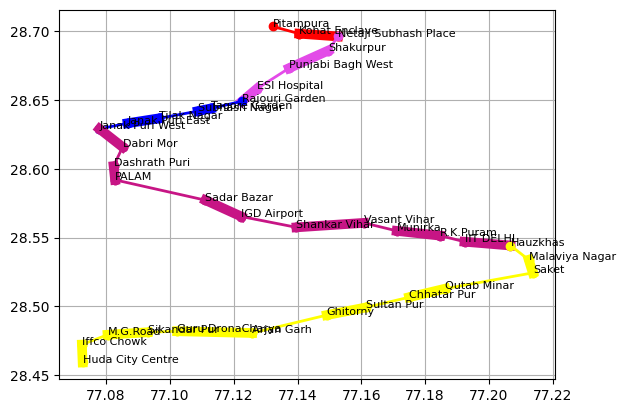

In [ ]:
# ax = plt.subplots(1, figsize=(15, 15))
# geodata.plot(color=[colors[line] for line in geodata.Line])
print(coordinates)
x = []
y = []


path = get_path_optimal(15, 101)
temp=[]
print(path)
for p in path:
  lol="N.A"
  if p in id_to_station.keys():
    lol=id_to_station[p]
  print(lol,coordinates[p])
  temp.append(id_to_station[p])

print()
# for p in path:
#   x.append(coordinates[p][0])
#   y.append(coordinates[p][1])
# plt.plot(y,x)
for i in range(len(path)):

  stat_name=temp[i]
  plt.text(coordinates[path[i]][0], coordinates[path[i]][1],stat_name, fontsize=8)
  plt.grid(True)
  if i==len(path)-1:
    continue
  id1=path[i]
  id2=path[i+1]
  x1,x2,y1,y2=coordinates[id1][0],coordinates[id2][0],coordinates[id1][1],coordinates[id2][1]
  plt.plot([x1,x2],[y1,y2], linewidth=2+5*(i%2),color = colors[line_col[(id1, id2)]],marker='o')


In [ ]:
from bokeh.models import ColumnDataSource, Label
from bokeh.models.glyphs import Text
from bokeh.io import curdoc, show
from bokeh.models import ColumnDataSource, NumeralTickFormatter, HoverTool


data = {'x':[],
   'y':[],'stat_name':[]}

for i in range(0,250):
      start=coordinates.get(i)
      if start is None:
        continue
      p1,p2=start[0],start[1]
      SN=id_to_station[i]
      data['x'].append(p1)
      data['y'].append(p2)
      data['stat_name'].append(SN)

def show_route_load_bokeh(time,daytype):

  output_notebook()

  source = ColumnDataSource(data = data)

  TOOLTIPS = [
    ("Station", "@stat_name"),
    ("(x,y)", "(@x, $y)"),
]


  TITLE=f'Delhi Metro Route Load at {time} hrs on a '
  if daytype==1:
    TITLE+='Weekend'
  else :
    TITLE+='Weekday'

  my_scatter = figure(title=TITLE, x_axis_label='Longitude', y_axis_label='Latitude',tooltips=TOOLTIPS)

  time_data=time.split(":")
  tot_time=int(time_data[0])*60+int(time_data[1])
  time_bucket=tot_time//30


  # now just make connections

  for s1 in range(0,250):
    start = (coordinates.get(s1))


    if(start is None):
      continue

    #mytext = Text(x="x", y="y", text="text", angle=0.3, text_color="#96deb3")
    #mytext=Label(x=start[0], y=start[1], text=id_to_station[s1],text_font_size='0.2vw')
    #my_scatter.add_layout(mytext)
    for s2 in range(0,250):
      if route_load[s1][s2][time_bucket][daytype]>0:
        # print("Need to make weighted edge here b/w ", s1, " and ", s2)
        end = (coordinates.get(s2))
        if(end is None):
         continue
        temp=route_load[s1][s2][time_bucket][daytype]
        z_score=(temp-load_mean)/load_sd
        W=1
        if z_score<-1:
          W=1
        elif z_score>-1 and z_score<1:
          W=2
        elif z_score <3:
          W=3
        else:
          W=10
        #my_scatter.line([start[0], end[0]], [start[1], end[1]], line_width=(route_load[s1][s2][time_bucket][daytype])/1000, color = colors[line_col[(s1, s2)]])
        my_scatter.line([start[0], end[0]], [start[1], end[1]], line_width=W, color = colors[line_col[(s1, s2)]])
       # my_scatter.scatter([start[0], end[0]], [start[1], end[1]], size=route_load[s1][s2][time_bucket][daytype]/2000, color = 'red')

  #Label(x=77, y=28.5, text='A very long label\nwith mutiple lines')

  my_scatter.circle('x','y',size=4, source=source,color ="#CBC3C3")
  my_scatter.background_fill_color = "beige"
  show(my_scatter)

  return


# show_route_load_bokeh("12:34",0)
# show_route_load_bokeh("12:34",1)

for hour in range(8, 20):
  for min in ["00", "30"]:
    for daytype in range(1):
      show_route_load_bokeh(f"{hour}:{min}", daytype)


# final to do:

## Report format:
 - intro to transportation analysis ya fir intro and motivation
 - Dealing with data and how to efficiently make use of it (vlookup, web scraping and fuzzy search)
 - reasearch papers ka sar kya hai
 - analysis of metro
    - Station Load
    - Route Load
    - Heatmap for overall passenger flow. (zonal)
 - analysis of buses
    - Bus Stop Load
    - Bus Route Load
    - (Use of Live Data) For a given route, show where all buses are at a particular point of time.
 - Multimodal analysis :-
     - Divide into zones : overall traffic distribution (but how to do this for metro cuz we don't have live data for that, and for buses we don't have the data that we have for the time period of metro)
 - Future projections and recommmendations


<br>

## Types of results/analysis
  - Station Load:
    - Graph of Station Load varying throughout the day (on weekends vs weekdays)
    - Plot on the map with different sized circles for each station, get option to select time of the day.
  - Route Load:
    - All/Selected Routes plotted as lines between stations with thickness showing traffic
  - Bus specific:
    - Plot all live locations of buses
    -
  - Wordy results:
    - Identify congested regions and give suggestion to relax
    - (not sure if it should be added): get the ratio of station load with area in sq. ft. for each station and compare
    - Average time to get from one stop to the next per route

  - Common points:
    - Make all plots as GIFs with all timebuckets/stations as frames.


  - for combined multimodal anaylsis:
  figure out how to use shape file for zone bifurcation.
  

Recommendations:

1) In delhi metros, there is a clear peak at around 9 AM and 6 PM. So we can increase the staff around this time to circumvent the load at metro stations.

2) top 5 metro stations by dec. order of stat load: (total load across weekdays + weekends and all time buckets)

Rajiv Chowk': 843067,
 'New Delhi': 799889,
 'Huda City Centre': 731500,
 'Chandni Chowk': 694765,
 'City Centre': 614283,

3) top 5 bus stations by dec. order of stat load


Badarpur Border': 2141026,
 'Uttam Nagar Terminal': 1547483,
 'Anand Vihar ISBT': 1449123,
 'Mori Gate Terminal': 1284970,
 'Anand Vihar Terminal': 1252050

 4) yellow aur blue lines(blue line ka kaafi accha kar skte) ka route analysis as time varies. so ud hissab se specific stations ke beech me increase in metro frequency suggest kar skte apan.

 5) bus stations par peak hai at 6pm but utna nhi jitna 9 AM par hota. to matlab ki safety concerns in buses and also traffic zyada hota in the evening after dark

 6) Some examples of metro systems that have implemented infotainment systems include the Dubai Metro in Dubai, United Arab Emirates, and the Seoul Metropolitan Subway in Seoul, South Korea. However, it's important to note that the availability and extent of infotainment systems may vary across different metro systems. so we can also start such services. by selling our data to ad companies, they can find the optimal times at which they can feature their ads to maximal profit.

Based on the results of your analysis on station load and mobility patterns in Delhi metro and buses, here are some potential recommendations:

Optimize Route Planning: Use the station load data to identify high-demand routes and schedule more frequent services during peak hours. This can help alleviate congestion and improve overall passenger experience.

Improve Passenger Information Systems: Utilize the station load data to enhance real-time passenger information systems. This can include updating digital displays, mobile apps, or public address systems to provide accurate information on crowded stations, expected wait times, and alternative routes.

Capacity Expansion: Identify stations and routes that consistently experience high congestion and consider infrastructure improvements or capacity expansion measures, such as increasing the number of coaches or buses, to accommodate the growing demand.

Advertising Opportunities: Explore partnerships with advertising agencies to leverage the station load data and offer targeted advertising opportunities. Advertisements can be strategically placed inside metros and buses to generate revenue while providing relevant information and entertainment to passengers.

Integration with Other Modes of Transport: Analyze the data to identify major interchanges between metro and bus stations. Explore opportunities to improve connectivity and facilitate seamless transfers between different modes of transport, such as providing dedicated shuttle services or implementing integrated ticketing systems.

Crowd Management Strategies: Develop crowd management strategies based on station load data to ensure passenger safety and smooth flow of commuters during peak hours. This can involve deploying additional staff, implementing queue management systems, or introducing crowd control measures.

Feedback Mechanisms: Establish channels for collecting feedback from passengers to understand their concerns, suggestions, and priorities. This feedback can be valuable in making informed decisions and prioritizing improvements that address the specific needs of the commuters.